## Laboratorio 2: Análisis exploratorio en un problema de clasificación

### Utilizaremos en esta práctica las siguientes librerías
[numpy](http://www.numpy.org/) permite manipular matrices de modo sencillo e incorpora funciones de cálculo útiles.  
[pandas](http://pandas.pydata.org/) proporciona estructuras de datos fáciles de usar y funciones de acceso a datos desde múltiples fuentes y formatos.  
[matplotlib](matplotlib.org) permite generar múltiples tipos de gráficos.  
[re](https://docs.python.org/2/library/re.html#) permite manipular expresiones regulares.

In [1]:
%matplotlib inline
import re
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
import brewer2mpl
from matplotlib import rcParams

#colorbrewer2 Dark2 qualitative color table
dark2_cmap = brewer2mpl.get_map('Dark2', 'Qualitative', 7)
dark2_colors = dark2_cmap.mpl_colors

rcParams['figure.figsize'] = (10, 6)
rcParams['figure.dpi'] = 150
rcParams['lines.linewidth'] = 2
rcParams['axes.facecolor'] = 'white'
rcParams['font.size'] = 14
rcParams['patch.edgecolor'] = 'white'
rcParams['patch.facecolor'] = dark2_colors[0]
rcParams['font.family'] = 'StixGeneral'


# Para eliminar bordes en gráficas

def elimina_borde(axes=None, top=False, right=False, left=True, bottom=True):
    ax = axes or plt.gca()
    ax.spines['top'].set_visible(top)
    ax.spines['right'].set_visible(right)
    ax.spines['left'].set_visible(left)
    ax.spines['bottom'].set_visible(bottom)
    
    # Eliminar marcas
    ax.yaxis.set_ticks_position('none')
    ax.xaxis.set_ticks_position('none')
    
    # Rehabilitar visibles
    if top:
        ax.xaxis.tick_top()
    if bottom:
        ax.xaxis.tick_bottom()
    if left:
        ax.yaxis.tick_left()
    if right:
        ax.yaxis.tick_right()

In [3]:
pd.set_option('display.width', 500)
pd.set_option('display.max_columns', 100)

## Clasificación de aceites de oliva italianos

El punto de partida es una colección de datos extraídos de un conjunto de diferentes aceites de oliva. Cada muestra de aceite se representa mediante ocho parámetros, que se corresponden con los niveles de distintos ácidos grasos en cada aceite. Cada muestra de aceite pertenece a una de entre nueve variedades de aceite de oliva, de tres regiones y ocho áreas geográficas distintas de Italia. El objetivo del análisis es desarrollar un conjunto de reglas de clasificación que permitan distinguir de modo fiable los nueve aceites. Este es un problema de interés práctico, porque el aceite de algunas de las zonas está muy bien valorado, y existe cierto nivel de fraude en la denominación de origen. Además, el contenido en ácidos grasos varía con el clima, lo que resulta relevante para decidir qué variedades se han de plantar en según qué zonas. 

** Fuente: **  
Forina, M., Armanino, C., Lanteri, S. & Tiscornia, E. (1983), Classification of Olive Oils from their Fatty Acid Composition, in Martens, H. and
Russwurm Jr., H., eds, Food Research and Data Analysis, Applied Science
Publishers, London, pp. 189–214.

Número de muestras: 572

Número de variables: 10

*Descripción:* Los datos representan el porcentaje (x100) de ácidos grasos en la fracción lipídica de un conjunto de muestras de aceites de oliva procedentes de Italia. Los datos proceden de un estudio cuyo objetivo es la determinación de la autenticidad de la denominación de origen en el aceite de oliva.

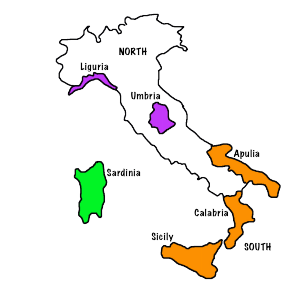

In [4]:
from IPython.display import Image
Image(filename='Italy.png')

## 1. Cargamos y limpiamos los datos
Cargamos los datos desde el fichero oliva.csv mediante las librerías pandas y visualizamos al menos las 5 primeras filas de datos. Como el fichero está en formato csv buscamos la existencia de alguna función en pandas de nombre `read_csv()`.

In [5]:
#almacenamos los datos del fichero en el objeto 'datos', de tipo Dataframe
datos = pd.read_csv('oliva.csv')
datos

,Unnamed: 0,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,1.Puglia-Nord,1,1,1075,75,226,7823,672,36,60,29
1,2.Puglia-Nord,1,1,1088,73,224,7709,781,31,61,29
2,3.Puglia-Nord,1,1,911,54,246,8113,549,31,63,29
3,4.Puglia-Nord,1,1,966,57,240,7952,619,50,78,35
4,5.Puglia-Nord,1,1,1051,67,259,7771,672,50,80,46
...,...,...,...,...,...,...,...,...,...,...,...
567,568.Liguria-Ovest,3,8,1280,110,290,7490,790,10,10,2
568,569.Liguria-Ovest,3,8,1060,100,270,7740,810,10,10,3
569,570.Liguria-Ovest,3,8,1010,90,210,7720,970,0,0,2
570,571.Liguria-Ovest,3,8,990,120,250,7750,870,10,10,2


Pondremos nombre a la primera columna, que carece de él. Para ello podemos consultar la existencia de alguna función en pandas de nombre `rename()`.

In [6]:
# Imprimimos en primer lugar los títulos de las columnas, que se encuentran en datos.columns
datos.columns

# Cambiamos columns[0] por 'procedencia'
datos = datos.rename(columns={'Unnamed: 0': u'procedencia'})
datos.columns

Index(['procedencia', 'región', 'área', 'palmítico', 'palmitoleico', 'esteárico', 'oleico', 'linoleico', 'linolénico', 'araquídico', 'eicosenoico'], dtype='object')

Queremos acceder a la subtabla formada por las columnas `oleico` y `linoleico`.

In [7]:
datos[[u'oleico', u'linoleico']]

,oleico,linoleico
0,7823,672
1,7709,781
2,8113,549
3,7952,619
4,7771,672
...,...,...
567,7490,790
568,7740,810
569,7720,970
570,7750,870


El resultado es un nuevo objeto, del tipo `DataFrame` de pandas. Queremos ahora acceder a una sola de las columnas, por ejemplo, la del ácido esteárico.

In [8]:
datos[u'esteárico']

0      226
1      224
2      246
3      240
4      259
      ... 
567    290
568    270
569    210
570    250
571    240
Name: esteárico, Length: 572, dtype: int64

El objeto obtenido es un objeto del tipo `Series` de pandas. Si utilizamos dos corchetes para indexar a partir de una lista obtendremos un objeto de tipo Dataframe. Analizaremos los tipos de ambos ejemplos mediante la función `type()`.

In [9]:
print ("tipo de datos[[u'esteárico']]:\t", type(datos[[u'esteárico']]))
print ("tipo de datos[u'esteárico']:\t", type(datos[u'esteárico']))

tipo de datos[[u'esteárico']]:	 <class 'pandas.core.frame.DataFrame'>
tipo de datos[u'esteárico']:	 <class 'pandas.core.series.Series'>


Si los nombres no tienen acentos podemos acceder a cada columna de una manera más sencilla, por ejemplo, mediante `datos.estearico`.

Volvemos a nuestra tabla de datos. Eliminaremos el número que acompaña a cada región de procedencia, ya que se extrajo del fichero junto con el nombre porque ambos aparecen separados por un punto. Para ello podemos utilizar tanto la función `split()` como la función `sub()` de la librería `re` de expresiones regulares, junto con la función `map()` para realizar el cambio con cada uno de los elementos de la columna de procedencia.

In [10]:
# Utilizamos una asignación del tipo datos['procedencia']=datos['procedencia'].map()
datos[u'procedencia'] = datos[u'procedencia'].map(lambda row : re.split('\.', row)[1])
datos

,procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,Puglia-Nord,1,1,1075,75,226,7823,672,36,60,29
1,Puglia-Nord,1,1,1088,73,224,7709,781,31,61,29
2,Puglia-Nord,1,1,911,54,246,8113,549,31,63,29
3,Puglia-Nord,1,1,966,57,240,7952,619,50,78,35
4,Puglia-Nord,1,1,1051,67,259,7771,672,50,80,46
...,...,...,...,...,...,...,...,...,...,...,...
567,Liguria-Ovest,3,8,1280,110,290,7490,790,10,10,2
568,Liguria-Ovest,3,8,1060,100,270,7740,810,10,10,3
569,Liguria-Ovest,3,8,1010,90,210,7720,970,0,0,2
570,Liguria-Ovest,3,8,990,120,250,7750,870,10,10,2


Resulta un poco confusa la existencia de una columna región y otra área, además de la que nombra la procedencia. Consultaremos qué valores distintos hay en ambas columnas. En este caso es sencillo porque el conjunto de datos no es muy extenso, pero utilizaremos la función `unique()` para hacer este análisis extensivo a cualquier conjunto de datos verdaderamente grande.

In [11]:
print(pd.unique(datos[u'región']))
print(pd.unique(datos[u'área']))

[1 2 3]
[1 2 3 4 5 6 9 7 8]


Necesitamos saber cuántas zonas únicas hay en el conjunto de datos, ya que a ellas asignaremos cada etiqueta de clase. Para ello podemos realizar una tabla de contingencia entre las etiquetas de regiones y las etiquetas de áreas. En python podemos hacer esto mediante la función `crosstab()`.

In [12]:
pd.crosstab(datos[u'región'], datos[u'área'])

área,1,2,3,4,5,6,7,8,9
región,,,,,,,,,
1,25,56,206,36,0,0,0,0,0
2,0,0,0,0,65,33,0,0,0
3,0,0,0,0,0,0,50,50,51


Generamos el conjunto de valores diferentes de la columna procedencia mediante la función `unique()`

In [13]:
print(pd.unique(datos[u'procedencia']))

['Puglia-Nord' 'Calabria' 'Puglia-Sud' 'Sicilia' 'Sardinia-Interno'
 'Sardinia-Costa' 'Umbria' 'Liguria-Est' 'Liguria-Ovest']


Recuperaremos los valores originales (en tanto por ciento) de la proporción de cada ácido graso en cada muestra de aceite, porque después su representación gráfica será más fácilmente comprensible. Para ello actuamos sobre las columnas que representan las proporciones de los ácidos grasos. Podemos utilizar la función `apply()` para dividir todos los valores entre 100.

In [14]:
# Definimos una lista con los nombres de los distintos ácidos
acidos = datos.columns[3:]

# Accedemos a cada uno de los valores de cada una de las columnas y lo dividimos entre 100 mediante apply()
for acido in acidos:
    datos[acido] = datos[acido].apply(lambda x : x/100)
datos

,procedencia,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
0,Puglia-Nord,1,1,10.75,0.75,2.26,78.23,6.72,0.36,0.60,0.29
1,Puglia-Nord,1,1,10.88,0.73,2.24,77.09,7.81,0.31,0.61,0.29
2,Puglia-Nord,1,1,9.11,0.54,2.46,81.13,5.49,0.31,0.63,0.29
3,Puglia-Nord,1,1,9.66,0.57,2.40,79.52,6.19,0.50,0.78,0.35
4,Puglia-Nord,1,1,10.51,0.67,2.59,77.71,6.72,0.50,0.80,0.46
...,...,...,...,...,...,...,...,...,...,...,...
567,Liguria-Ovest,3,8,12.80,1.10,2.90,74.90,7.90,0.10,0.10,0.02
568,Liguria-Ovest,3,8,10.60,1.00,2.70,77.40,8.10,0.10,0.10,0.03
569,Liguria-Ovest,3,8,10.10,0.90,2.10,77.20,9.70,0.00,0.00,0.02
570,Liguria-Ovest,3,8,9.90,1.20,2.50,77.50,8.70,0.10,0.10,0.02


Podemos comprobar que la composición de ácidos grasos es consistente, es decir, que la suma de las proporciones de los ácidos grasos para cada muestra se mantiene próximo al 100%.

In [15]:
print(np.min(datos[acidos].apply(np.sum, axis='columns')))
print(np.max(datos[acidos].apply(np.sum, axis='columns')))

98.11
101.02000000000001


Representamos mediante gráficos de dispersión los datos correspondientes a la presencia de ácido palmítico y ácido palmitoleico en el total de las muestras. Las librerías pyplot utilizan la noción de figura actual y ejes actuales. Para realizar esta figura podemos hacer uso de la función `scatter()`. También podemos utilizar las funciones `set_title()`, `set_xlabel()` y `set_ylabel()` para añadir rótulos a la figura a partir del objeto que representa los ejes, que podemos extraer mediante la función `gca()`.

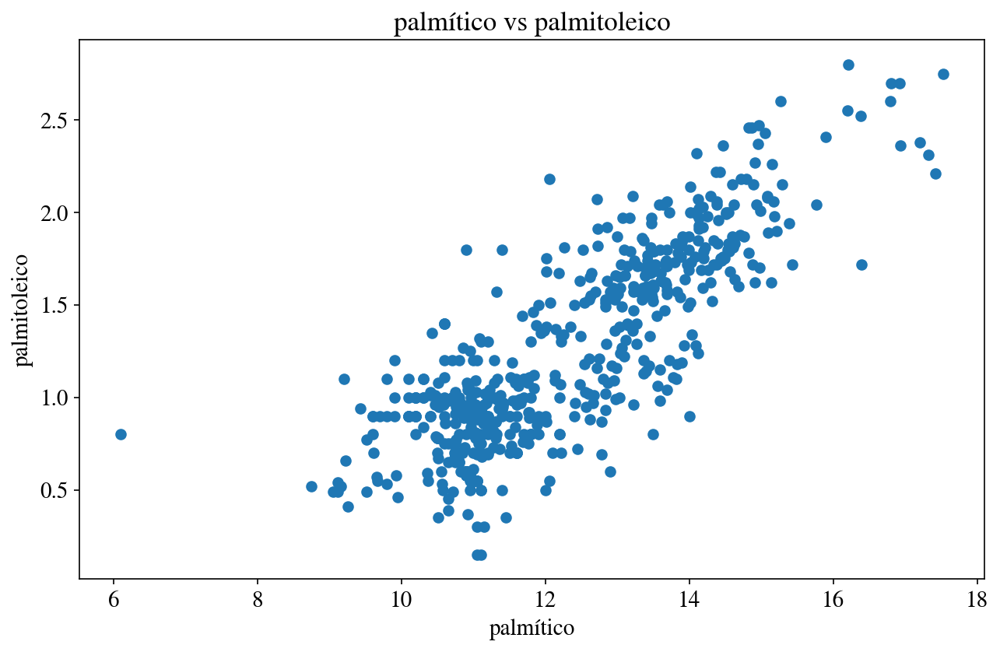

In [16]:
# Definimos la figura actual
fig = plt.figure()

# Definimos los ejes actuales
axis = fig.gca()

# Introducimos título de la figura y de los ejes a partir del objeto axis
axis.set_title(u'palmítico vs palmitoleico')
axis.set_xlabel(u'palmítico')
axis.set_ylabel(u'palmitoleico')

plt.scatter(datos[u'palmítico'], datos[u'palmitoleico'])

Representamos gráficamente el histograma de la presencia de ácido palmitoleico en el conjunto de muestras. Hacemos uso para ello de la función `hist()`.

(array([  9.,  53., 132., 120.,  44.,  90.,  75.,  29.,  13.,   7.]),
 array([0.15 , 0.415, 0.68 , 0.945, 1.21 , 1.475, 1.74 , 2.005, 2.27 ,
        2.535, 2.8  ]),
 <BarContainer object of 10 artists>)

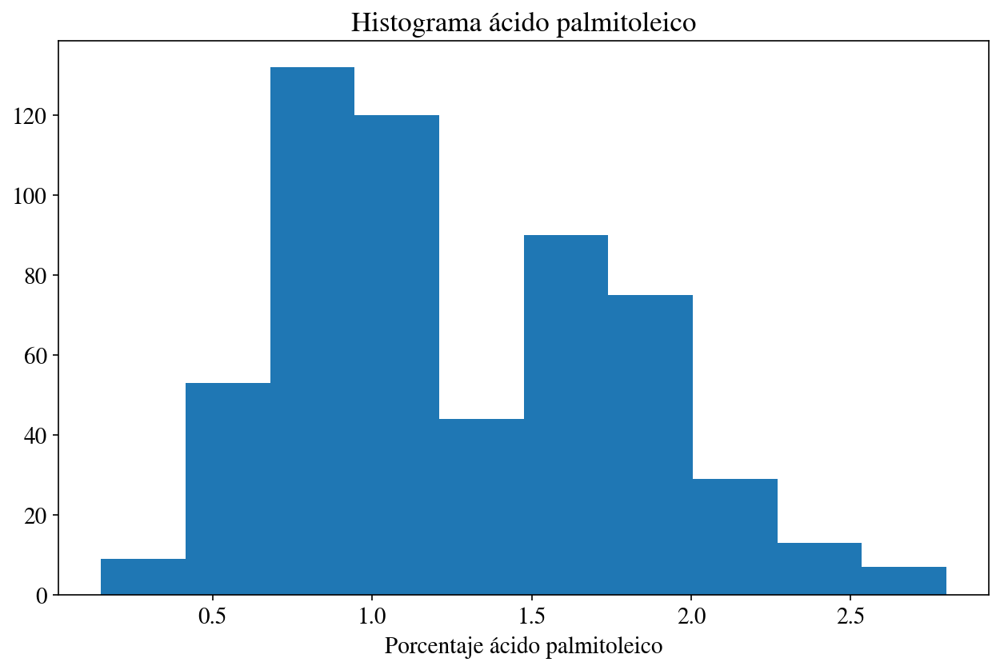

In [17]:
fig = plt.figure()
axis = fig.gca()
axis.set_title(u'Histograma ácido palmitoleico')
axis.set_xlabel('Porcentaje ácido palmitoleico')
plt.hist(datos[u'palmitoleico'])

Utilizaremos la función `subplots()` para representar cuatro figuras en una matriz de dos por dos.

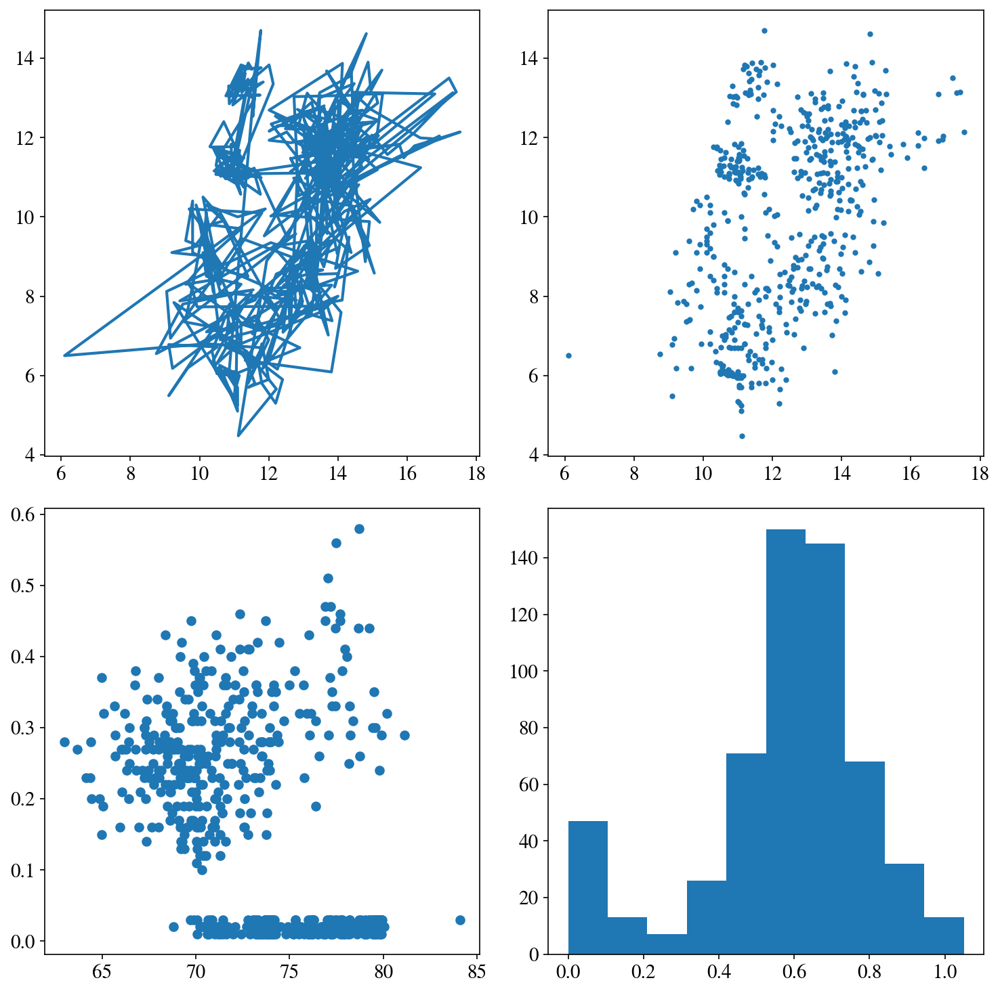

In [18]:
fig, axes=plt.subplots(figsize=(10,10), nrows=2, ncols=2)
axes[0][0].plot(datos[u'palmítico'], datos[u'linoleico'])
axes[0][1].plot(datos[u'palmítico'], datos[u'linoleico'], '.')
axes[1][0].scatter(datos[u'oleico'], datos[u'eicosenoico'])
axes[1][1].hist(datos[u'araquídico'])
fig.tight_layout()

Representaremos mediante gráficos de dispersión los ácidos grasos de la lista `acidos_y` frente a los de la lista `acidos_x`. Podemos dibujar los ácidos grasos de la lista `acidos_y`en el eje 'y' y los ácidos grasos de la lista `acidos_x` en el eje 'x'. La representación se hará mediante una matriz de figuras de 3 filas y 2 columnas. Etiquetar convenientemente cada figura. Para no contar el número de elementos en las listas, podemos utilizar la función `enumerate()`.

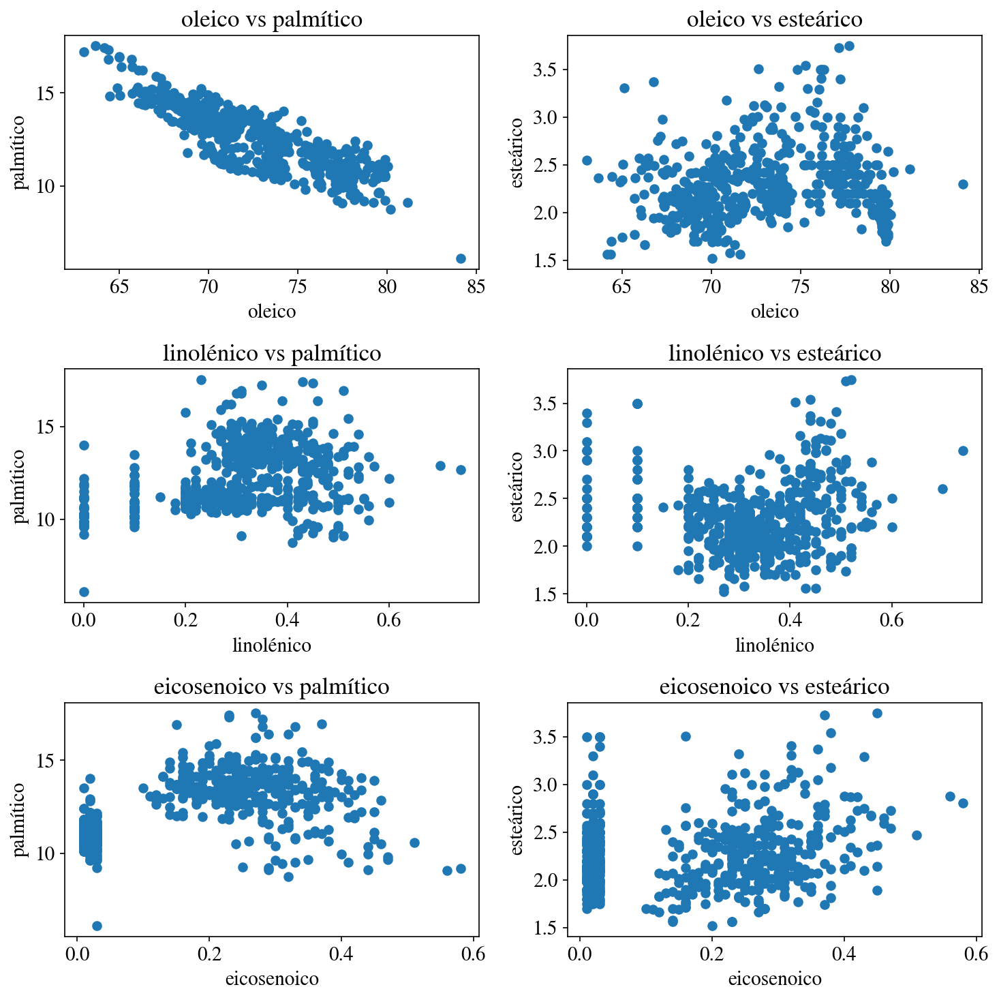

In [19]:
acidos_x=[u'oleico', u'linolénico', u'eicosenoico']
acidos_y=[u'palmítico', u'esteárico']

# Utilizaremos dos bucles recorriendo la lista de acidos_x y acidos_y
fig, axes=plt.subplots(figsize=(10,10), nrows=3, ncols=2)
for i, x in enumerate(acidos_x):
    for j, y in enumerate(acidos_y):
        axes[i][j].scatter(datos[x], datos[y])
        axes[i][j].set_title('{} vs {}'.format(x, y))
        axes[i][j].set_xlabel(x)
        axes[i][j].set_ylabel(y)
fig.tight_layout()

Utilizaremos la función `groupby()` para realizar distintos agrupamientos de los valores de la tabla. En primer lugar, agruparemos por el valor la columna `región`, que nos permitirá dividir el conjunto de datos en tres subconjuntos.

In [20]:
regiones = datos.groupby([u'región'])

La función `groupby()` proporciona un objeto de tipo diccionario, donde las claves son los valores que permiten el agrupamiento, y los grupos direccionados por las claves son los correspondientes subconjuntos de la matriz inicial. Podemos direccionar los tres subconjuntos correspondientes a las tres regiones iterando mediante un bucle.

In [21]:
for region in regiones:
    print(region)

(1,      procedencia  región  área  palmítico  palmitoleico  esteárico  oleico  linoleico  linolénico  araquídico  eicosenoico
0    Puglia-Nord       1     1      10.75          0.75       2.26   78.23       6.72        0.36        0.60         0.29
1    Puglia-Nord       1     1      10.88          0.73       2.24   77.09       7.81        0.31        0.61         0.29
2    Puglia-Nord       1     1       9.11          0.54       2.46   81.13       5.49        0.31        0.63         0.29
3    Puglia-Nord       1     1       9.66          0.57       2.40   79.52       6.19        0.50        0.78         0.35
4    Puglia-Nord       1     1      10.51          0.67       2.59   77.71       6.72        0.50        0.80         0.46
..           ...     ...   ...        ...           ...        ...     ...        ...         ...         ...          ...
318   Puglia-Sud       1     3      16.38          2.52       2.15   65.70      11.99        0.39        0.53         0.29
319   Puglia

Como vemos, la función `groupby()` no solo realiza un agrupamiento visual, sino que identifica cada uno de los grupos como objetos en sí mismos del tipo `DataFrame`, sobre los que podemos operar. Por ejemplo, podemos utilizar la función `describe()` para analizar cada una de las regiones de un modo inmediato.

In [22]:
regiones.describe()

área                                              palmítico                                                              palmitoleico                                                     esteárico                                                     oleico                                                             linoleico                                                             linolénico                                                   araquídico                                  \
        count      mean       std  min  25%  50%  75%  max     count       mean       std    min      25%     50%      75%    max        count      mean       std   min     25%   50%   75%   max     count      mean       std   min    25%   50%    75%   max  count       mean       std    min      25%     50%     75%    max     count       mean       std    min      25%     50%     75%    max      count      mean       std   min   25%   50%   75%   max      count      mean       std   min   25%   
región                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                              
1       323.0  2.783282  0.741054  1.0  2.5  3.0  3.0  4.0     323.0  13.322879  1.529349   8.75  12.6800  13.460  14.1900  17.53        323.0  1.548019  0.507237  0.35  1.2150  1.63  1.85  2.80     323.0  2.287740  0.398709  1.52  2.015  2.23  2.495  3.75  323.0  71.000093  3.451431  63.00  68.8300  70.300  72.835  81.13     323.0  10.334985  2.106730   4.48   8.5550  10.900  12.025  14.62      323.0  0.380650  0.079727  0.20  0.32  0.37  0.44  0.74      323.0  0.631176  0.111644  0.32  0.56   
2        98.0  5.336735  0.475023  5.0  5.0  5.0  6.0  6.0      98.0  11.113469  0.404111  10.30  10.8525  11.075  11.3725  12.13         98.0  0.967449  0.138514  0.35  0.8825  0.96  1.04  1.35      98.0  2.261837  0.176363  1.99  2.120  2.22  2.395  2.72   98.0  72.680204  1.418783  68.82  71.3725  73.255  73.810  74.39      98.0  11.965306  1.072336  10.57  11.1225  11.465  13.065  14.70       98.0  0.270918  0.053844  0.15  0.23  0.27  0.30  0.43       98.0  0.731735  0.118826  0.45  0.66   
3       151.0  8.006623  0.820542  7.0  7.0  8.0  9.0  9.0     151.0  10.948013  0.825635   6.10  10.6000  10.900  11.2500  14.00        151.0  0.837351  0.264388  0.15  0.6900  0.80  1.00  1.80     151.0  2.308013  0.389560  1.70  2.000  2.30  2.500  3.50  151.0  77.930530  1.648155  73.40  76.8000  78.000  79.500  84.10     151.0   7.270331  1.431226   5.10   6.0200   6.800   8.250  10.50      151.0  0.217881  0.168865  0.00  0.10  0.20  0.35  0.70      151.0  0.375762  0.293586  0.00  0.10   

                          eicosenoico                                                     
         50%    75%   max       count      mean       std   min   25%   50%    75%   max  
región                                                                                    
1       0.62  0.690  1.02       323.0  0.273220  0.083915  0.10  0.22  0.27  0.320  0.58  
2       0.72  0.810  1.05        98.0  0.019388  0.007436  0.01  0.01  0.02  0.020  0.03  
3       0.38  0.595  1.00       151.0  0.019735  0.007298  0.01  0.01  0.02  0.025  0.03

Un ejemplo de lo que podemos hacer es iterar sobre el conjunto de series de valores para cada columna en cada región, y calcular la desviación estándar mediante la función `std()`. Observa el tipo del resultado como conjunto de desviaciones estándar para cada columna.

In [23]:
for region in regiones:
    print(region[1][acidos].std())

palmítico       1.529349
palmitoleico    0.507237
esteárico       0.398709
oleico          3.451431
linoleico       2.106730
linolénico      0.079727
araquídico      0.111644
eicosenoico     0.083915
dtype: float64
palmítico       0.404111
palmitoleico    0.138514
esteárico       0.176363
oleico          1.418783
linoleico       1.072336
linolénico      0.053844
araquídico      0.118826
eicosenoico     0.007436
dtype: float64
palmítico       0.825635
palmitoleico    0.264388
esteárico       0.389560
oleico          1.648155
linoleico       1.431226
linolénico      0.168865
araquídico      0.293586
eicosenoico     0.007298
dtype: float64


Además, pandas permite reunir los resultados de ejecutar `std()` en un nuevo objeto del tipo `DataFrame`. Y lo hace él todo. Podemos simplemente aplicar la función `std()` sobre el resultado del agrupamiento realizado mediante `groupby()`.

In [24]:
regiones_desviacion = regiones.std()
regiones_desviacion

,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
región,,,,,,,,,
1,0.741054,1.529349,0.507237,0.398709,3.451431,2.106730,0.079727,0.111644,0.083915
2,0.475023,0.404111,0.138514,0.176363,1.418783,1.072336,0.053844,0.118826,0.007436
3,0.820542,0.825635,0.264388,0.389560,1.648155,1.431226,0.168865,0.293586,0.007298


Podemos utilizar la función `agreggate()` para aplicar distintas funciones de cálculo a los datos del nuevo objeto, por ejemplo `np.sum()` `np.mean()`. La aplicación de estas funciones se realiza columna a columna. 

In [25]:
print(regiones_desviacion.aggregate(np.sum))
print(regiones_desviacion.aggregate(np.mean))

área            2.036619
palmítico       2.759094
palmitoleico    0.910139
esteárico       0.964632
oleico          6.518369
linoleico       4.610291
linolénico      0.302436
araquídico      0.524056
eicosenoico     0.098649
dtype: float64
área            0.678873
palmítico       0.919698
palmitoleico    0.303380
esteárico       0.321544
oleico          2.172790
linoleico       1.536764
linolénico      0.100812
araquídico      0.174685
eicosenoico     0.032883
dtype: float64


In [26]:
regiones.aggregate(lambda x: x.oleico.mean())
# ¿Qué estamos haciendo?
# para cada region hacer la media de la columna oleico

,procedencia,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
región,,,,,,,,,,
1,71.000093,71.000093,71.000093,71.000093,71.000093,71.000093,71.000093,71.000093,71.000093,71.000093
2,72.680204,72.680204,72.680204,72.680204,72.680204,72.680204,72.680204,72.680204,72.680204,72.680204
3,77.930530,77.930530,77.930530,77.930530,77.930530,77.930530,77.930530,77.930530,77.930530,77.930530


También podemos utilizar la función `apply()` para aplicar una función determinada al nuevo objeto. Por ejemplo, podemos volver a realizar la media sobre los valores de las columnas de cada una de las regiones. Aunque pueden coincidir en algunos resultados, la función `apply()` opera sobre cada grupo, mientras que `aggregate()` opera sobre cada una de las columnas.

In [27]:
regiones_media = regiones.apply(np.mean)
regiones_media

,región,área,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
región,,,,,,,,,,
1,1.0,2.783282,13.322879,1.548019,2.287740,71.000093,10.334985,0.380650,0.631176,0.273220
2,2.0,5.336735,11.113469,0.967449,2.261837,72.680204,11.965306,0.270918,0.731735,0.019388
3,3.0,8.006623,10.948013,0.837351,2.308013,77.930530,7.270331,0.217881,0.375762,0.019735


Renombraremos las columnas de la tabla datos_std para añadir después de cada nombre la extensión '`_std`'. Para ello podemos iterar sobre todas las cadenas de `acidos`, añadiendo la subcadena `_std` después de cada cadena. Esto se puede hacer mediante una sencilla estructura diccionario en la que hacemos corresponder a cada cadena de ácidos una nueva cadena en la que añadimos '`_std`'. La función a utilizar es `rename()` donde haremos `inplace = True` para hacer la sustitución sobre la misma estructura de datos, y no sobre una copia.

In [28]:
for r in regiones_desviacion:
    regiones_desviacion.rename(columns={r: r+'_std'}, inplace=True)
regiones_desviacion

,área_std,palmítico_std,palmitoleico_std,esteárico_std,oleico_std,linoleico_std,linolénico_std,araquídico_std,eicosenoico_std
región,,,,,,,,,
1,0.741054,1.529349,0.507237,0.398709,3.451431,2.106730,0.079727,0.111644,0.083915
2,0.475023,0.404111,0.138514,0.176363,1.418783,1.072336,0.053844,0.118826,0.007436
3,0.820542,0.825635,0.264388,0.389560,1.648155,1.431226,0.168865,0.293586,0.007298


Haremos una sencilla operación de unión entre tablas para disponer de una nueva tabla en la que representamos la media y la desviación estándar para el ácido oleico en cada una de las tres regiones. Para ello extraemos dos estructuras dataframe a partir de `datos_mean` y `datos_std` para la columna de interés. Después utilizamos la función `join()` para unir ambas estructuras.

In [29]:
oleico_media = regiones_media[['oleico']]
oleico_desviacion = regiones_desviacion[['oleico_std']]
oleico = oleico_media.join(oleico_desviacion)
oleico

,oleico,oleico_std
región,,
1,71.000093,3.451431
2,72.680204,1.418783
3,77.930530,1.648155


## 2. Análisis exploratorio de datos en una dimensión

In [30]:
clave_region=[1,2,3]
valor_region=['Sud','Sardinia','Nord']
dict_region={e[0]:e[1] for e in zip(clave_region,valor_region)}
dict_region

{1: 'Sud', 2: 'Sardinia', 3: 'Nord'}

Vamos a volver sobre la tabla en la que representábamos los valores medios de cada ácido graso en cada región. En esa tabla aparecían también los valores medios del área, lo que es un tanto anómalo. Extraeremos una nueva tabla en la que sólo aparecerán los valores medios correspondientes a ácidos grasos.

In [31]:
regiones_media = regiones_media[['palmítico', 'palmitoleico', 'esteárico', 'oleico', 'linoleico', 'linolénico', 'araquídico', 'eicosenoico']]
regiones_media

,palmítico,palmitoleico,esteárico,oleico,linoleico,linolénico,araquídico,eicosenoico
región,,,,,,,,
1,13.322879,1.548019,2.287740,71.000093,10.334985,0.380650,0.631176,0.273220
2,11.113469,0.967449,2.261837,72.680204,11.965306,0.270918,0.731735,0.019388
3,10.948013,0.837351,2.308013,77.930530,7.270331,0.217881,0.375762,0.019735


Realizaremos un gráfico de barras con los porcentajes relativos de ácidos grasos. Podemos utilizar la opción kind='barh'. En el gráfico llamaremos a la región 1 'Sud', a la 2 'Sardinia' y a la 3 'Nord', de acuerdo con el mapa inicialmente proporcionado.

(0.0, 100.0)

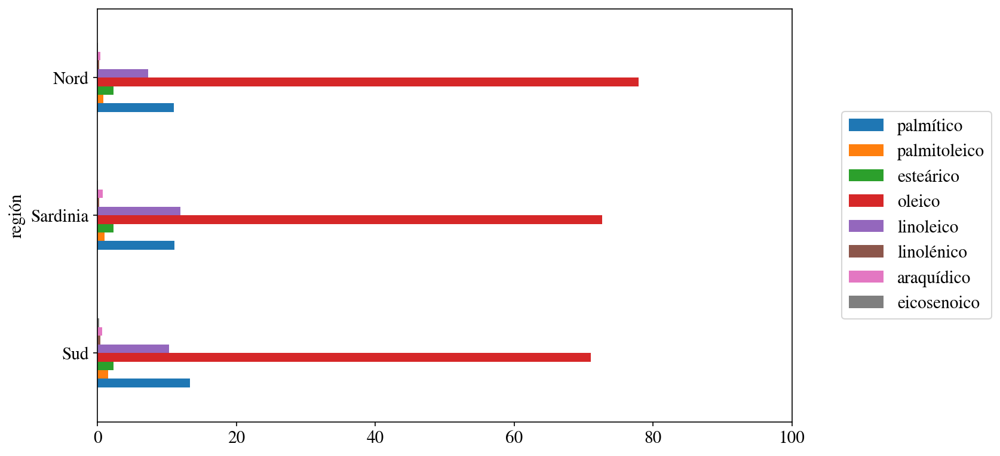

In [32]:
regiones_media.index = regiones_media.index.map(dict_region)
ax = regiones_media.plot(kind='barh')

# Para sacar fuera de la gráfica la leyenda y facilitar la inspección
ax.legend(loc='right',bbox_to_anchor=(1.3,0.5))
ax.set_xlim([0,100])

Hemos representado las proporciones de ácidos grasos en cada región. Representaremos ahora para cada ácido graso, su distribución por regiones. Para ello, en primer lugar podemos dividir una figura en tantas subfiguras como ácidos grasos, mediante la función `subplots()`. Un lazo nos permitirá recorrer cada una de las subfiguras, y en cada una de ellas representaremos tres histogramas, cada uno de ellos representando el histograma del correspondiente ácido graso en una de las tres regiones.

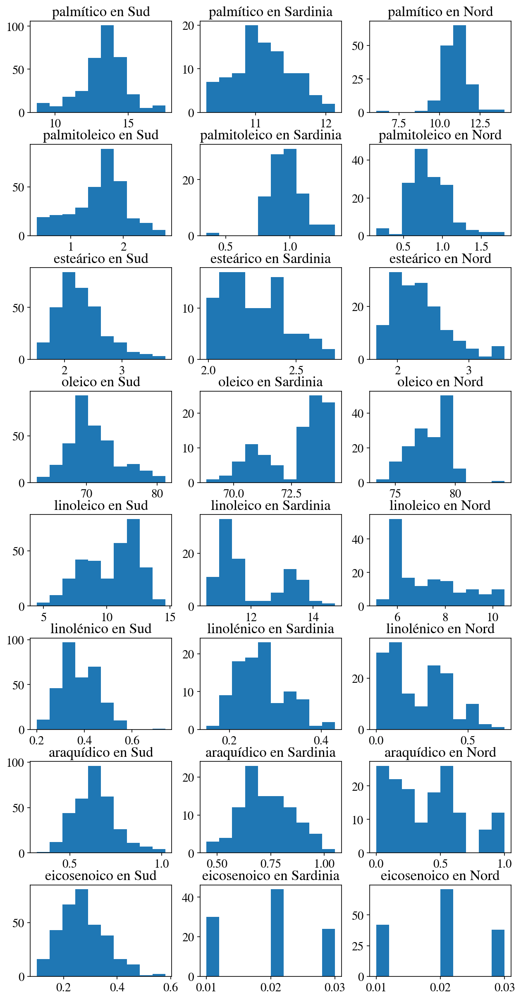

In [33]:
fig, axes=plt.subplots(figsize=(10,20), nrows=len(acidos), ncols=3)
fig.subplots_adjust(hspace=0.35)
for i, acido in enumerate(acidos):
    for j, region in enumerate(regiones):
        axes[i][j].hist(region[1][acido])
        axes[i][j].set_title('{} en {}'.format(acido, dict_region[region[0]]))


Podemos calcular la frecuencia relativa acumulada del ácido graso eicosenoico respecto a un valor determinado (p.ej. 0.05) como la fracción de valores menores a 0.05 respecto al total. Para ello, podemos obtener la serie de condiciones a partir de la columna del ácido graso eicosenoico, lo que nos devolverá una serie de valores de verdad cierto o falso. Si luego sumamos mediante la función `np.sum()` los valores ciertos obtenemos el número total de valores menores que 0.05. Si aplicamos la función `np.mean()` obtenemos el valor deseado de la frecuencia relativa acumulada.

In [34]:
menores005 = datos['eicosenoico'] < 0.05
print(np.sum(menores005))
print(np.mean(menores005))

249
0.4353146853146853


Con pandas podemos indexar un objeto mediante una condición. Interpreta el siguiente código.

En la siguiente celda con la línea `bajo=datos[datos[u'eicosenoico'] < 0.02]` se están filtrando las filas por la columna eicosenoico quedándose únicamente con los que en esa columna tengan un valor inferior a 0.02 .

Con la línea `pd.crosstab(bajo[u'área'],bajo[u'región'])` se muestra una tabla de contingencia en la que se puede ver la relación entre la variable región y área.

In [35]:
bajo=datos[datos[u'eicosenoico'] < 0.02]
pd.crosstab(bajo[u'área'],bajo[u'región'])

región,2,3
área,,
5,19,0
6,11,0
7,0,17
8,0,11
9,0,14


En la tabla anterior vemos que no hay columna correspondiente a la región 1, es por el filtrado realizado, quiere decir que en la región 1 el ácido eicosenoico esta por encima de 0.02 en todas las muestras.

Se puede ver que en el área 5 es donde más aceites hay con un ácido eicosenoico por debajo de 0.02, en la tabla hay campos a 0 porque las áreas solo pertenecen a una región.

Hemos visto que el ácido oleico domina a los demás, lo que dificulta el análisis del resto de ácidos grasos. Eliminaremos el ácido oleico y representaremos los demás de nuevo mediante un diagrama de barras. ¿Qué podemos decir respecto al ácido eicosenoico?

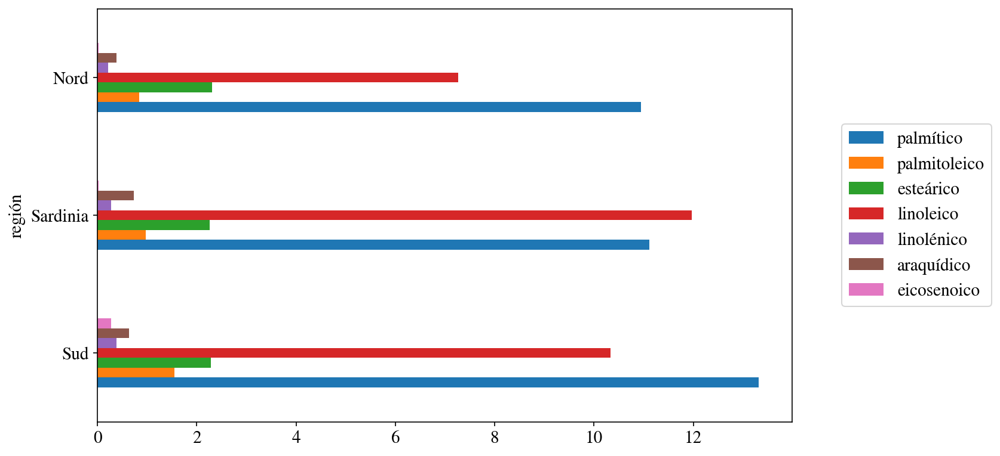

In [36]:
menosoleico=[u'palmítico',u'palmitoleico',u'esteárico',u'linoleico',u'linolénico',u'araquídico',u'eicosenoico']
regiones_menosoleico = regiones_media[menosoleico]
ax = regiones_menosoleico.plot(kind='barh')

# Para sacar fuera de la gráfica la leyenda y facilitar la inspección
ax.legend(loc='right',bbox_to_anchor=(1.3,0.5))

En la gráfica anterior se puede ver que el ácido eicosenoico está presente principalmente en la región 1.
En las otras regiones el porcentaje medio del ácido eicosenoico es tan pequeño que ni se puede ver en la gráfica.

Representa tres gráficos, uno por cada región, con los diagramas de cajas para cada uno de los ácidos grasos, menos el oleico. ¿Podemos decir algo respecto al ácido linoleico?

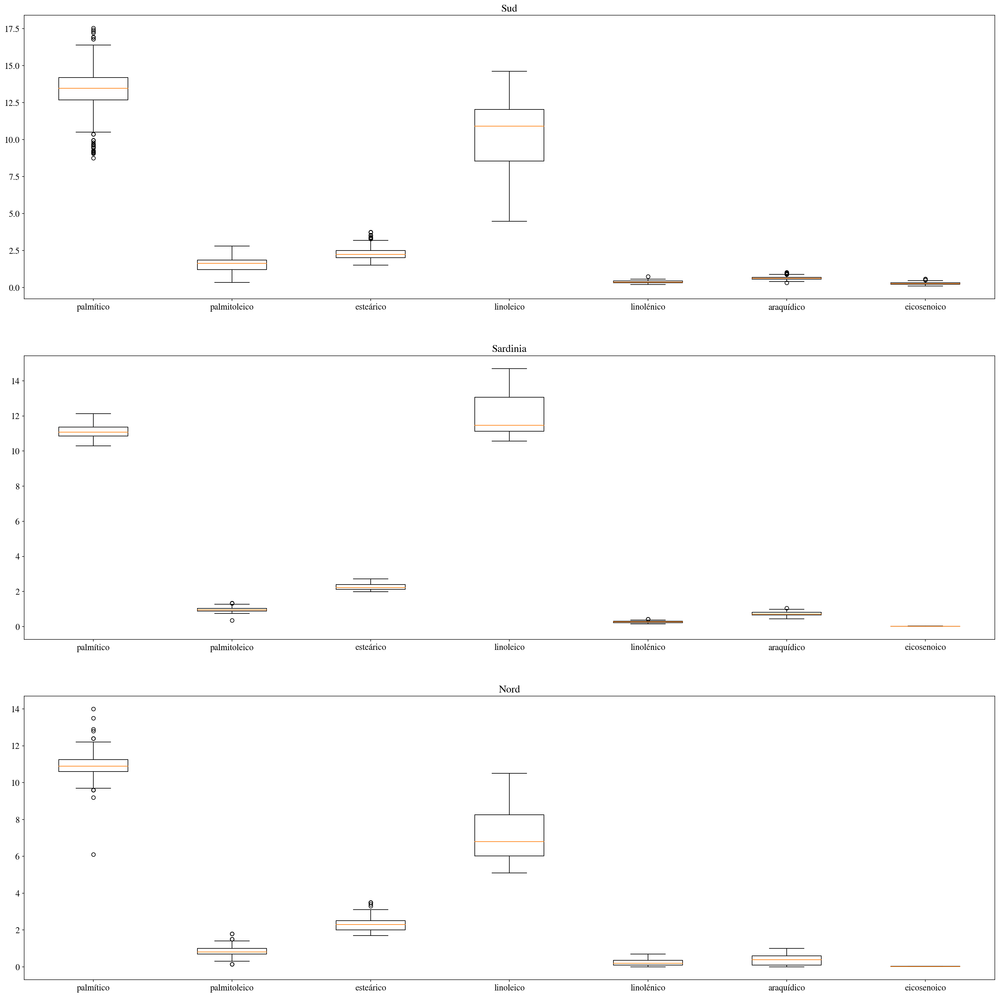

In [37]:
fig, axes = plt.subplots(figsize=(28,28), nrows=3)
for clave, group in datos.groupby(u'región'):
    axes[clave-1].boxplot(group[menosoleico])
    axes[clave-1].set_title(dict_region[clave])
    axes[clave-1].set_xticklabels(menosoleico)

En los gráficos anteriores podemos ver que el ácido linoleico tiene una mayor variabilidad que el resto de ácidos representados, se puede apreciar en que la caja es más grande.

También podemos ver que el ácido linoleico junto con el ácido palmítico están en mayor proporción respecto al resto de ácidos representados.

Representa un diagrama de coordenadas paralelas para los distintos ácidos grasos, mediante la función parallel_coordinates(). Puede ser útil normalizar los datos para que la media sea cero. Juega con distintos valores del parámetro alpha para poder distinguir mejor los distintos haces de valores.

<AxesSubplot:>

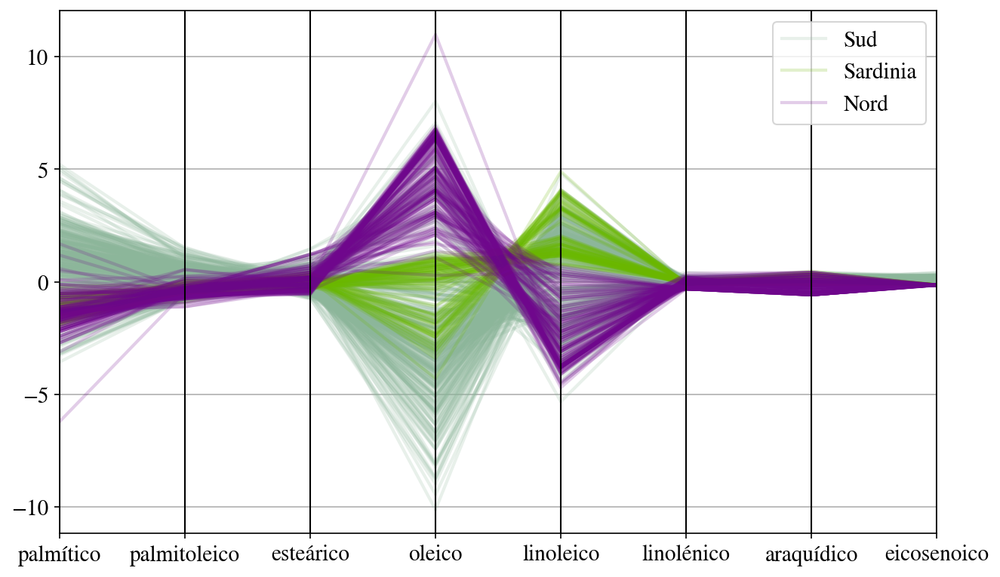

In [38]:
from pandas.plotting import parallel_coordinates
datos_mean = datos[acidos].apply(np.mean)
datos0mean = datos[acidos].apply(lambda x: x-datos_mean[x.name])
datos0mean['región'] = datos['región'].apply(lambda x: dict_region[x])
parallel_coordinates(datos0mean, 'región', alpha=0.2)

Representa un diagrama de dispersión del ácido linoleico frente al araquídico, diferenciando las tres regiones. Este gráfico es útil cuando queremos enfatizar un aspecto visual de los datos en una justificación. ¿Qué podemos decir respecto a la separabilidad de las distintas regiones? 

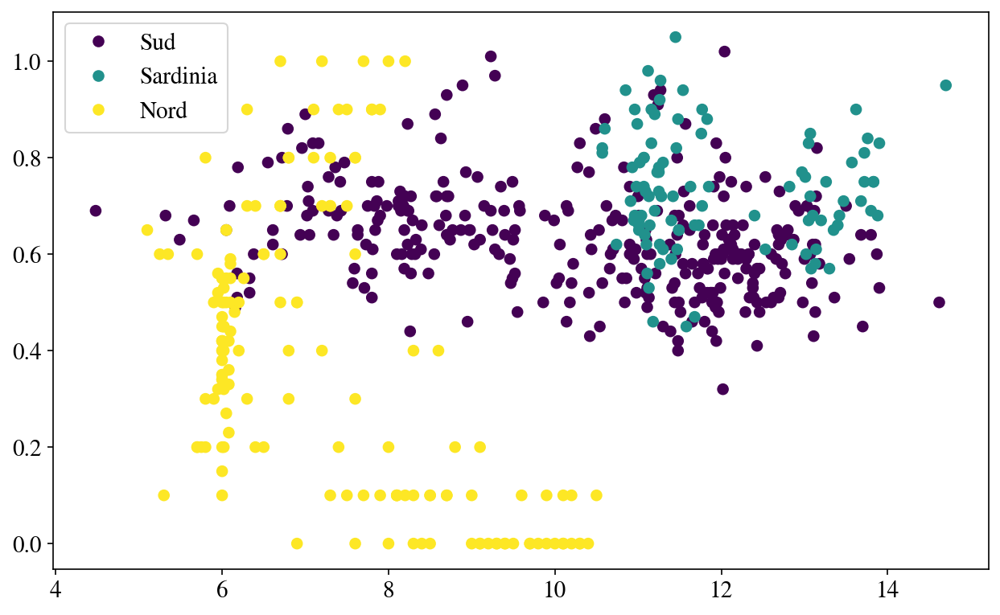

In [39]:
ax = plt.scatter(datos['linoleico'], datos['araquídico'], c=datos['región'])
handles, labels = ax.legend_elements()
plt.legend(handles, [dict_region[int(l[14])] for l in labels])

En la gráfica anterior podemos ver que las regiones Sud y Sardinia se sobreponen, lo que dificultaría su separabilidad.
Por otro lado en la region Nord la mayoría de puntos están bien diferenciados, aunque parte de ellos se sobreponen con la región Sud, pero sería más fácilmente diferenciable que la Sardinia.

Representa mediante diagramas de dispersión los distintos ácidos grasos dos a dos. No es necesario permutar los parámetros en la representación. Indaga sobre la separabilidad observada.

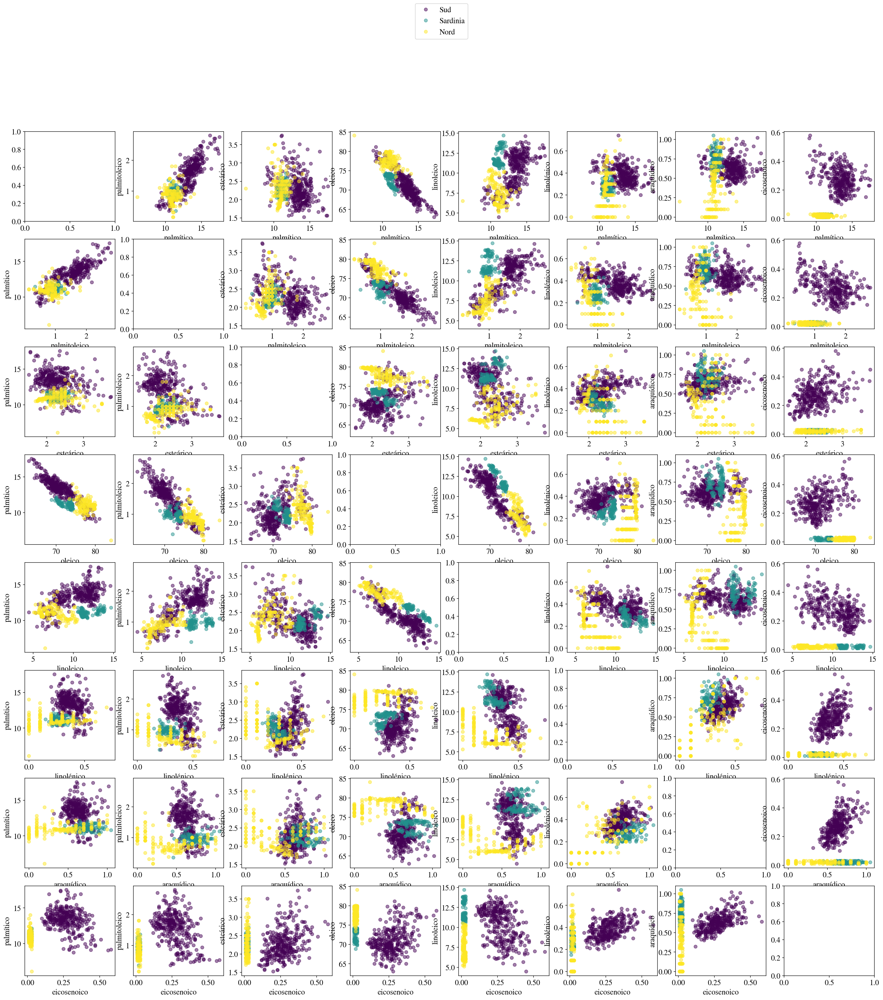

In [40]:
fig, axes = plt.subplots(figsize=(28,28), nrows=len(acidos), ncols=len(acidos))
for i, a1 in enumerate(acidos):
    for j, a2 in enumerate(acidos):
        if a1 != a2:
            s = axes[i][j].scatter(datos[a1], datos[a2], c=datos['región'], alpha=0.5)
            axes[i][j].set_xlabel(a1)
            axes[i][j].set_ylabel(a2)
            handles, labels = s.legend_elements()
fig.legend(handles, [dict_region[int(l[14])] for l in labels], loc='upper center')

En primer lugar podemos observar que la región Sud es claramente diferenciable con el ácido eicosenoico.
Por otro lado también podemos ver que las regiones Sardinia y Nord son diferenciables mediante los ácidos oleico y linolénico.

Hasta aquí hemos realizado un análisis de los distintos aceites según su región de procedencia. Podríamos extender el trabajo a las distintas áreas de procedencia, analizando igualmente la separabilidad. ¿Qué podríamos concluir?

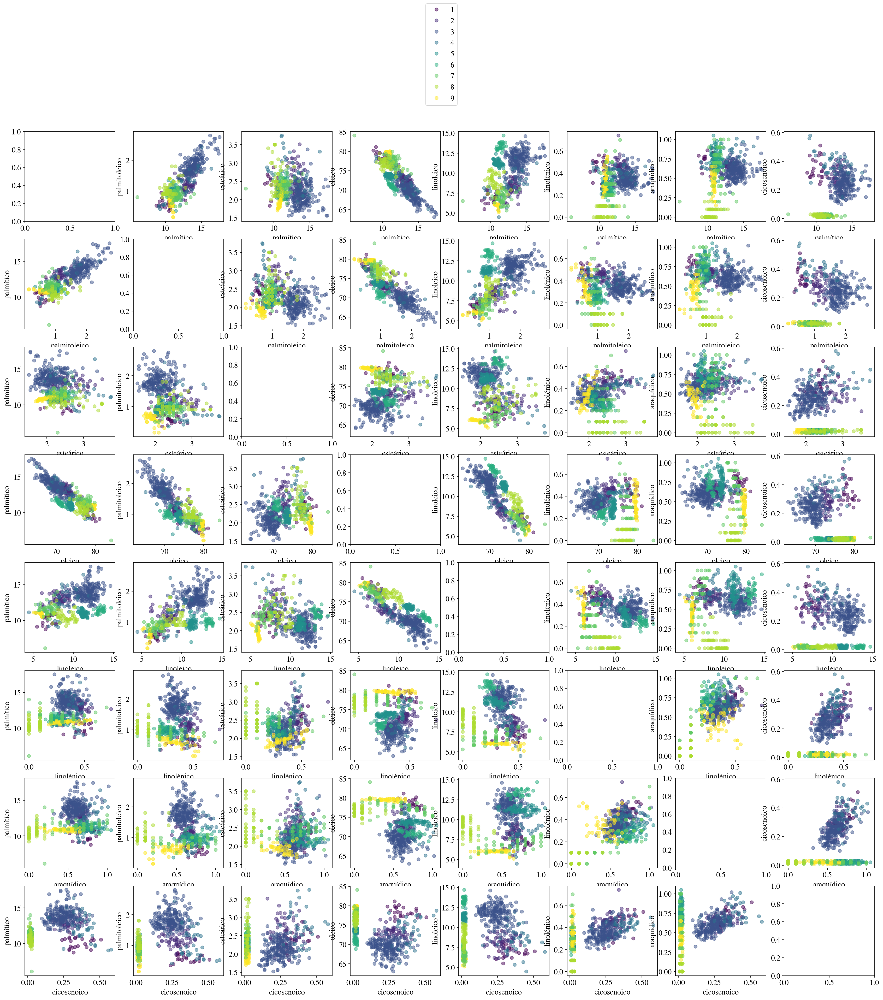

In [41]:
fig, axes = plt.subplots(figsize=(28,28), nrows=len(acidos), ncols=len(acidos))
for i, a1 in enumerate(acidos):
    for j, a2 in enumerate(acidos):
        if a1 != a2:
            s = axes[i][j].scatter(datos[a1], datos[a2], c=datos['área'], alpha=0.5)
            axes[i][j].set_xlabel(a1)
            axes[i][j].set_ylabel(a2)
            handles, labels = s.legend_elements()
fig.legend(handles, labels, loc='upper center')

Representando mediante diagramas de dispersión los distintos ácidos grasos dos a dos y dándoles color por área se hace muy complejo analizarlo, porque hay muchos colores solapados, pero en algunos casos sigue siendo fácil reconocer las zonas por regiones como es el caso del ácido eicosenoico.
